# CNN Based Stock Market Prediction

In the following section, the CNN model is changed in a bid to improve on the results obtained in the paper.

## 2D-CNN-pred

### 1. Importing important libraries

In [ ]:
import os
import random
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D, Input
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.callbacks import ModelCheckpoint
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, f1_score, mean_absolute_error

### 2. Preprocessing

The data is split into training and testing set. Further, the training set is divided into training and validation.

In [ ]:
#DATADIR = "./Dataset"
TRAIN_TEST_CUTOFF = '2016-04-21'
TRAIN_VALID_RATIO = 0.75

The data is organised into dictionaries with the keys of the dictionary set to the name of the stock market index. Further the data is scaled using 'Standard Scaler'.

In [ ]:
data = {}
for filename in os.listdir():
    if not filename.lower().endswith(".csv"):
        continue # read only the CSV files
    #filepath = os.path.join(DATADIR, filename)
    X = pd.read_csv(filename, index_col="Date", parse_dates=True)
    # basic preprocessing: get the name, the classification
    # Save the target variable as a column in dataframe for easier dropna()
    name = X["Name"][0]
    del X["Name"]
    cols = X.columns
    X["Target"] = (X["Close"].pct_change().shift(-1) > 0).astype(int)
    X.dropna(inplace=True)
    # Fit the standard scaler using the training dataset
    index = X.index[X.index < TRAIN_TEST_CUTOFF]
    index = index[:int(len(index) * TRAIN_VALID_RATIO)]
    scaler = StandardScaler().fit(X.loc[index, cols])
    # Save scale transformed dataframe
    X[cols] = scaler.transform(X[cols])
    data[name] = X

In [ ]:
data.keys()

dict_keys(['DJI', 'NASDAQ', 'S&P', 'NYA', 'RUT'])

A data generator is formed which can produce batches of data when called by our model.

In [ ]:
def datagen(data, seq_len, batch_size, targetcol, kind):
    "As a generator to produce samples for Keras model"
    batch = []
    while True:
        # Pick one dataframe from the pool
        key = random.choice(list(data.keys()))
        df = data[key]
        input_cols = [c for c in df.columns if c != targetcol]
        index = df.index[df.index < TRAIN_TEST_CUTOFF]
        split = int(len(index) * TRAIN_VALID_RATIO)
        if kind == 'train':
            index = index[:split]   # range for the training set
        elif kind == 'valid':
            index = index[split:]   # range for the validation set
        # Pick one position, then clip a sequence length
        while True:
            t = random.choice(index)      # pick one time step
            n = (df.index == t).argmax()  # find its position in the dataframe
            if n-seq_len+1 < 0:
                continue # can't get enough data for one sequence length
            frame = df.iloc[n-seq_len+1:n+1]
            batch.append([frame[input_cols].values, df.loc[t, targetcol]])
            break
        # if we get enough for a batch, dispatch
        if len(batch) == batch_size:
            X, y = zip(*batch)
            X, y = np.expand_dims(np.array(X), 3), np.array(y)
            yield X, y
            batch = []

In [ ]:
os.listdir()

['.config',
 'Processed_NASDAQ.csv',
 'Processed_NYSE.csv',
 'Processed_S&P.csv',
 'Processed_RUSSELL.csv',
 'Processed_DJI.csv',
 'sample_data']

### 3. Exploratory Data Analysis

In [ ]:
data_describe = []
for x in list(data.keys()):
  data_describe.append(data[x].describe())

In [ ]:
print('Statistics for DJI')
data_describe[0]

Statistics for DJI


,Close,Volume,mom,mom1,mom2,mom3,ROC_5,ROC_10,ROC_15,ROC_20,...,silver-F,RUSSELL-F,S&P-F,CHF,Dollar index-F,Dollar index,wheat-F,XAG,XAU,Target
count,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,...,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000
mean,0.868493,0.027317,-0.001019,-0.006336,-0.012951,-0.008157,-0.017499,-0.034659,-0.043706,-0.043927,...,0.020602,-0.005016,-0.006687,-0.022671,-0.025442,-0.022401,-0.013534,0.017262,0.017190,0.540395
std,1.419872,0.866796,0.955295,0.988825,0.999903,0.973450,0.978113,0.997062,1.003621,1.017998,...,0.913062,0.933417,0.927949,1.202126,1.028481,1.110184,0.935326,0.897847,0.923532,0.498589
min,-1.626952,-22.543717,-5.250868,-6.542958,-6.693987,-6.309092,-5.921638,-5.636308,-5.408074,-4.753225,...,-4.405068,-4.490829,-4.639448,-23.898904,-5.059325,-9.267594,-5.588101,-5.826094,-4.886080,0.000000
25%,-0.523869,0.015477,-0.430103,-0.443402,-0.456758,-0.408676,-0.510231,-0.572699,-0.573803,-0.546589,...,-0.380101,-0.498015,-0.424395,-0.509244,-0.631815,-0.641627,-0.585970,-0.377511,-0.481757,0.000000
50%,1.123828,0.025234,-0.006719,-0.013862,-0.021472,-0.005532,0.035388,0.011648,0.021887,0.010467,...,0.034439,0.043936,-0.014171,0.006482,-0.023294,-0.037810,-0.035520,0.025859,0.036934,1.000000
75%,1.896966,0.038600,0.480619,0.503723,0.504487,0.464655,0.526003,0.548831,0.584226,0.642168,...,0.476768,0.503540,0.447331,0.537375,0.543259,0.566008,0.511133,0.462535,0.544250,1.000000
max,4.020585,10.973554,4.669528,4.866209,4.977250,4.726370,3.664485,3.277976,3.050749,2.691565,...,5.974623,5.589831,5.493087,7.605846,3.837663,8.545027,3.689821,3.247888,3.904366,1.000000


In [ ]:
print('Statistics for NASDAQ')
data_describe[1]

Statistics for NASDAQ


,Close,Volume,mom,mom1,mom2,mom3,ROC_5,ROC_10,ROC_15,ROC_20,...,silver-F,RUSSELL-F,S&P-F,CHF,Dollar index-F,Dollar index,wheat-F,XAG,XAU,Target
count,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,...,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000
mean,1.029749,-0.024824,-0.003502,-0.005026,-0.016699,-0.004156,-0.015005,-0.031115,-0.045977,-0.053217,...,0.020602,-0.005016,-0.006687,-0.022671,-0.025442,-0.022401,-0.013534,0.017262,0.017190,0.570018
std,1.570861,0.871515,0.948379,0.968765,0.974746,0.954033,0.971419,0.987402,0.985814,0.980395,...,0.913062,0.933417,0.927949,1.202126,1.028481,1.110184,0.935326,0.897847,0.923532,0.495296
min,-1.375572,-3.368210,-4.920546,-6.666596,-6.684521,-6.379534,-5.437671,-5.025877,-4.737962,-4.401986,...,-4.405068,-4.490829,-4.639448,-23.898904,-5.059325,-9.267594,-5.588101,-5.826094,-4.886080,0.000000
25%,-0.548908,-0.314496,-0.447022,-0.455624,-0.459525,-0.411178,-0.548081,-0.591973,-0.560061,-0.537062,...,-0.380101,-0.498015,-0.424395,-0.509244,-0.631815,-0.641627,-0.585970,-0.377511,-0.481757,0.000000
50%,1.253526,-0.086876,0.041358,0.029016,0.004347,0.031500,0.082564,0.018158,0.003442,0.011847,...,0.034439,0.043936,-0.014171,0.006482,-0.023294,-0.037810,-0.035520,0.025859,0.036934,1.000000
75%,2.305853,0.163851,0.501626,0.510786,0.502314,0.485802,0.569943,0.586770,0.583162,0.552335,...,0.476768,0.503540,0.447331,0.537375,0.543259,0.566008,0.511133,0.462535,0.544250,1.000000
max,4.413149,21.141834,4.847035,4.980625,4.992763,4.246365,3.294711,3.349728,2.686331,2.452535,...,5.974623,5.589831,5.493087,7.605846,3.837663,8.545027,3.689821,3.247888,3.904366,1.000000


In [ ]:
print('Statistics for S&P')
data_describe[2]

Statistics for S&P


,Close,Volume,mom,mom1,mom2,mom3,ROC_5,ROC_10,ROC_15,ROC_20,...,silver-F,RUSSELL-F,S&P-F,CHF,Dollar index-F,Dollar index,wheat-F,XAG,XAU,Target
count,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,...,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000
mean,0.871245,-0.014679,-0.004831,-0.009220,-0.018501,-0.011275,-0.024925,-0.048652,-0.067630,-0.076933,...,0.020602,-0.005016,-0.006687,-0.022671,-0.025442,-0.022401,-0.013534,0.017262,0.017190,0.547576
std,1.385800,0.913697,0.934482,0.962111,0.973626,0.947504,0.954181,0.969990,0.969281,0.971880,...,0.913062,0.933417,0.927949,1.202126,1.028481,1.110184,0.935326,0.897847,0.923532,0.497955
min,-1.515047,-2.948447,-5.012029,-7.189847,-7.329418,-6.914825,-5.832547,-5.848984,-5.459586,-4.846248,...,-4.405068,-4.490829,-4.639448,-23.898904,-5.059325,-9.267594,-5.588101,-5.826094,-4.886080,0.000000
25%,-0.593143,-0.393383,-0.418341,-0.422038,-0.439038,-0.387797,-0.459824,-0.539701,-0.568418,-0.524983,...,-0.380101,-0.498015,-0.424395,-0.509244,-0.631815,-0.641627,-0.585970,-0.377511,-0.481757,0.000000
50%,1.178819,-0.093769,-0.015313,-0.017829,-0.030818,-0.010204,0.033693,-0.007537,0.015796,0.009666,...,0.034439,0.043936,-0.014171,0.006482,-0.023294,-0.037810,-0.035520,0.025859,0.036934,1.000000
75%,2.000734,0.263288,0.450220,0.475815,0.467465,0.438196,0.516082,0.535885,0.548313,0.537572,...,0.476768,0.503540,0.447331,0.537375,0.543259,0.566008,0.511133,0.462535,0.544250,1.000000
max,3.458073,13.386818,4.815753,4.985816,5.080729,4.717711,3.616231,3.301933,3.053923,2.741919,...,5.974623,5.589831,5.493087,7.605846,3.837663,8.545027,3.689821,3.247888,3.904366,1.000000


In [ ]:
print('Statistics for NYSE')
data_describe[3]

Statistics for NYSE


,Close,Volume,mom,mom1,mom2,mom3,ROC_5,ROC_10,ROC_15,ROC_20,...,silver-F,RUSSELL-F,S&P-F,CHF,Dollar index-F,Dollar index,wheat-F,XAG,XAU,Target
count,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,...,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000
mean,0.595041,-0.024447,-0.000070,-0.005145,-0.010032,-0.005922,-0.012514,-0.033913,-0.055714,-0.066968,...,0.020602,-0.005016,-0.006687,-0.022671,-0.025442,-0.022401,-0.013534,0.017262,0.017190,0.542190
std,1.125973,0.945617,0.923187,0.945845,0.958828,0.936252,0.948434,0.964761,0.960887,0.960164,...,0.913062,0.933417,0.927949,1.202126,1.028481,1.110184,0.935326,0.897847,0.923532,0.498441
min,-1.809352,-4.259319,-5.401698,-7.138739,-7.229694,-6.906791,-5.047188,-5.036455,-4.738808,-4.753391,...,-4.405068,-4.490829,-4.639448,-23.898904,-5.059325,-9.267594,-5.588101,-5.826094,-4.886080,0.000000
25%,-0.545611,-0.380053,-0.438742,-0.443036,-0.443864,-0.404140,-0.473472,-0.520971,-0.560604,-0.537744,...,-0.380101,-0.498015,-0.424395,-0.509244,-0.631815,-0.641627,-0.585970,-0.377511,-0.481757,0.000000
50%,0.968202,-0.084133,0.011516,0.003069,0.003154,0.016487,0.039367,0.014458,0.033100,-0.023624,...,0.034439,0.043936,-0.014171,0.006482,-0.023294,-0.037810,-0.035520,0.025859,0.036934,1.000000
75%,1.559377,0.270894,0.473370,0.495666,0.498526,0.466661,0.523031,0.546598,0.547961,0.532779,...,0.476768,0.503540,0.447331,0.537375,0.543259,0.566008,0.511133,0.462535,0.544250,1.000000
max,2.551522,13.279743,5.127559,5.229348,5.301280,4.550524,3.796928,3.285800,3.439598,3.103676,...,5.974623,5.589831,5.493087,7.605846,3.837663,8.545027,3.689821,3.247888,3.904366,1.000000


In [ ]:
print('Statistics for RUSSELL')
data_describe[3]

Statistics for RUSSELL


,Close,Volume,mom,mom1,mom2,mom3,ROC_5,ROC_10,ROC_15,ROC_20,...,silver-F,RUSSELL-F,S&P-F,CHF,Dollar index-F,Dollar index,wheat-F,XAG,XAU,Target
count,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,...,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000,1114.000000
mean,0.595041,-0.024447,-0.000070,-0.005145,-0.010032,-0.005922,-0.012514,-0.033913,-0.055714,-0.066968,...,0.020602,-0.005016,-0.006687,-0.022671,-0.025442,-0.022401,-0.013534,0.017262,0.017190,0.542190
std,1.125973,0.945617,0.923187,0.945845,0.958828,0.936252,0.948434,0.964761,0.960887,0.960164,...,0.913062,0.933417,0.927949,1.202126,1.028481,1.110184,0.935326,0.897847,0.923532,0.498441
min,-1.809352,-4.259319,-5.401698,-7.138739,-7.229694,-6.906791,-5.047188,-5.036455,-4.738808,-4.753391,...,-4.405068,-4.490829,-4.639448,-23.898904,-5.059325,-9.267594,-5.588101,-5.826094,-4.886080,0.000000
25%,-0.545611,-0.380053,-0.438742,-0.443036,-0.443864,-0.404140,-0.473472,-0.520971,-0.560604,-0.537744,...,-0.380101,-0.498015,-0.424395,-0.509244,-0.631815,-0.641627,-0.585970,-0.377511,-0.481757,0.000000
50%,0.968202,-0.084133,0.011516,0.003069,0.003154,0.016487,0.039367,0.014458,0.033100,-0.023624,...,0.034439,0.043936,-0.014171,0.006482,-0.023294,-0.037810,-0.035520,0.025859,0.036934,1.000000
75%,1.559377,0.270894,0.473370,0.495666,0.498526,0.466661,0.523031,0.546598,0.547961,0.532779,...,0.476768,0.503540,0.447331,0.537375,0.543259,0.566008,0.511133,0.462535,0.544250,1.000000
max,2.551522,13.279743,5.127559,5.229348,5.301280,4.550524,3.796928,3.285800,3.439598,3.103676,...,5.974623,5.589831,5.493087,7.605846,3.837663,8.545027,3.689821,3.247888,3.904366,1.000000


Heatmap for DJI


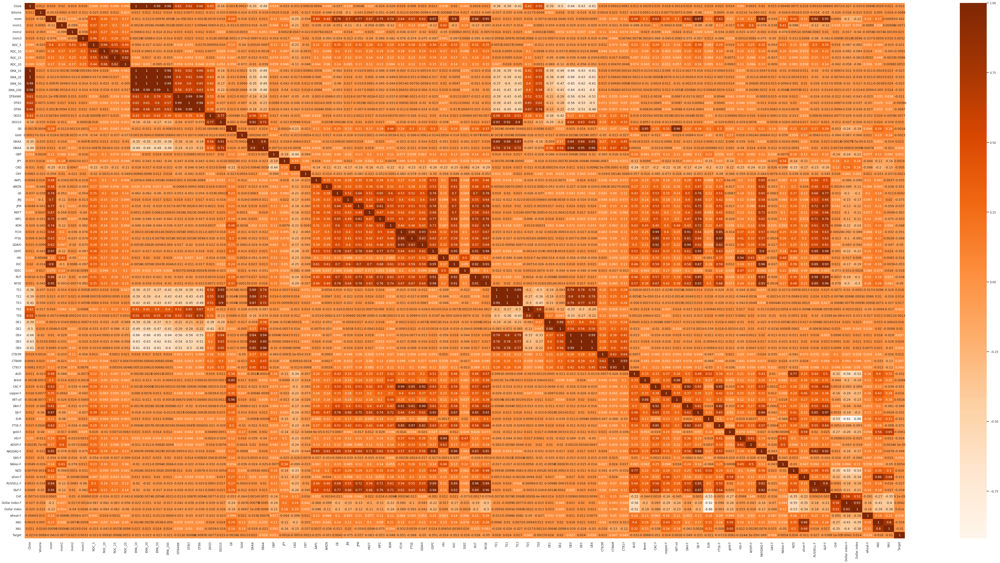

Heatmap for NASDAQ


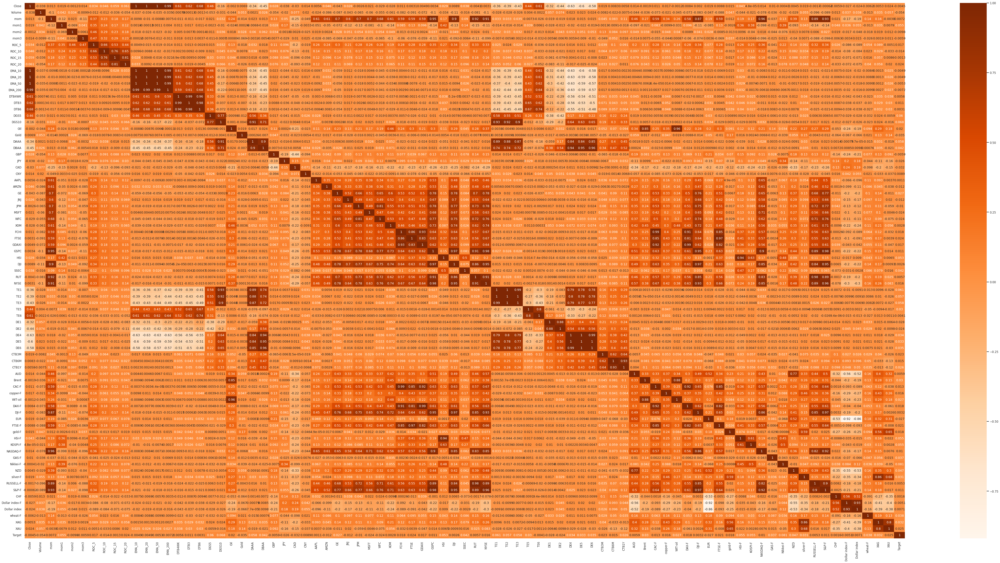

Heatmap for S&P


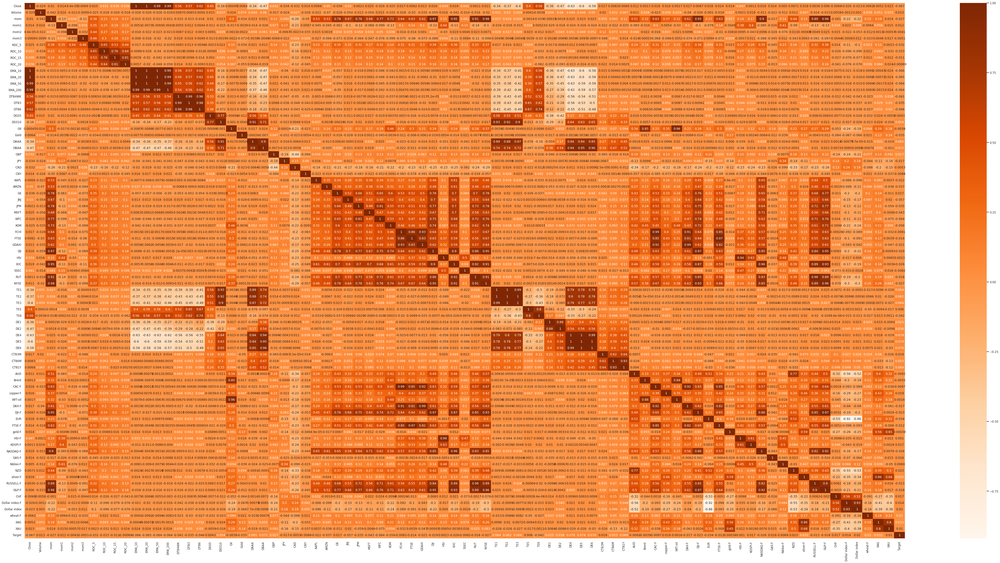

Heatmap for NYA


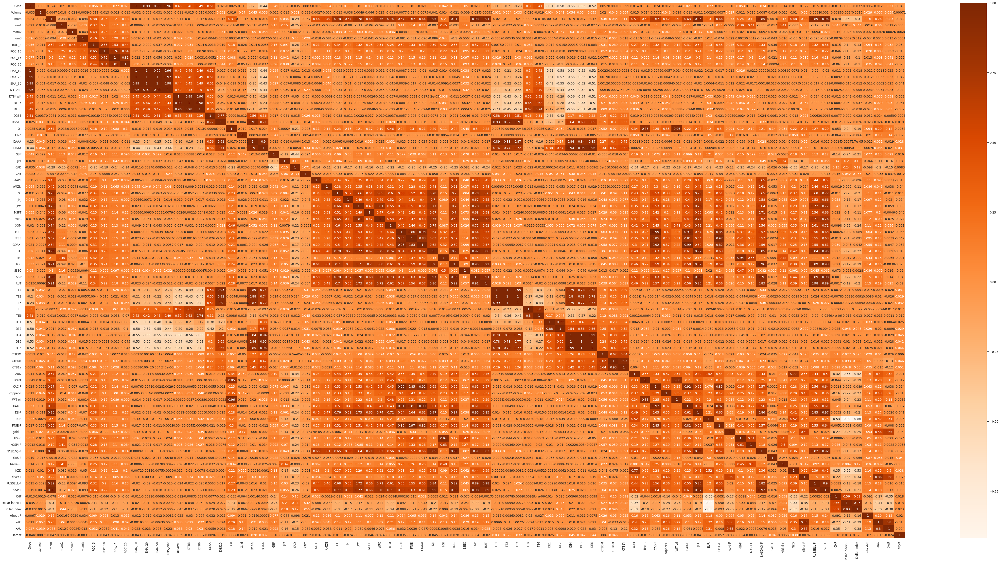

Heatmap for RUT


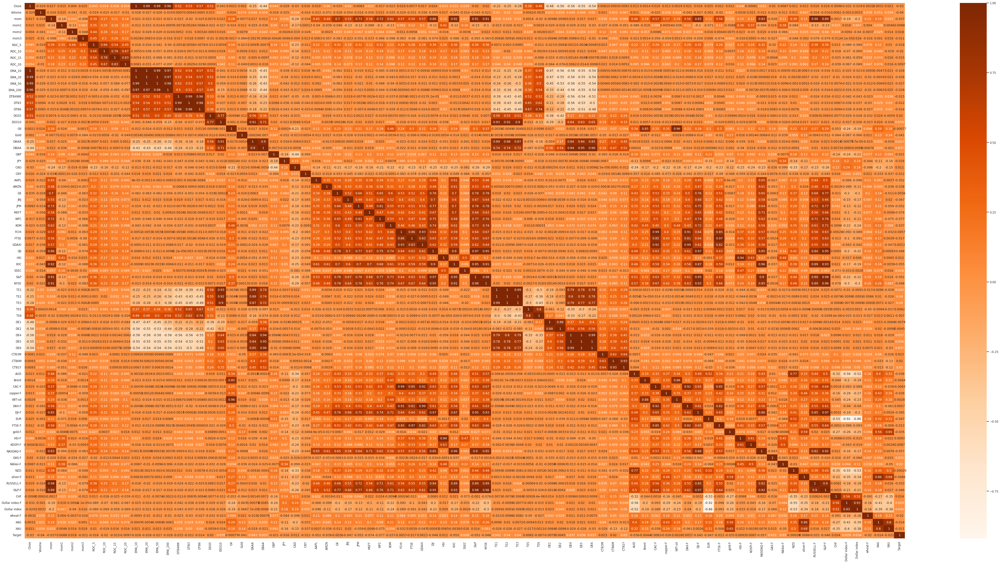

In [ ]:
for X in list(data.keys()):
  print(f'Heatmap for {X}')
  sns.set(rc={'figure.figsize':(80,40)})
  sns.set_context("talk", font_scale=0.7)
  sns.heatmap(data[X].corr(), cmap='Oranges', annot=True)
  plt.show()

### 4. Model Formulation

The model from the paper is implemented. It contains 2 convolution layers with number of filters = 10. The kernel size are (1x82) and (4x1). This is followed by a max pooling layer which reduces the dimension by half. It is followed by another convolution layer of kernel size = (4 x 1) and a Max Pooling layer. Then another convolutional layer of kernel size (4 x 1) is added. Then it is flattened and fed to a Dense layer which returns the output.

In [ ]:
def cnnpred_2d(seq_len=60, n_features=82, n_filters=(10,10,10,10), droprate=0.2):
    "2D-CNNpred model according to the paper"
    model = Sequential([
        Input(shape=(seq_len, n_features, 1)),
        Conv2D(n_filters[0], kernel_size=(1, n_features), activation="relu"),
        Conv2D(n_filters[1], kernel_size=(4,1), activation="relu"),
        MaxPool2D(pool_size=(2,1)),
        Conv2D(n_filters[2], kernel_size=(4,1), activation="relu"),
        MaxPool2D(pool_size=(2,1)),
        Conv2D(n_filters[3], kernel_size=(4,1), activation="relu"),
        Flatten(),
        Dropout(droprate),
        Dense(1, activation="sigmoid")
    ])
    return model

The metrics to evaluate our model are F1 score and accuracy. The mean absolute error is used as the loss function.

In [ ]:
from tensorflow.keras import backend as K

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

def f1macro(y_true, y_pred):
    f_pos = f1_m(y_true, y_pred)
    # negative version of the data and prediction
    f_neg = f1_m(1-y_true, 1-K.clip(y_pred,0,1))
    return (f_pos + f_neg)/2

### 4. Model Training

In [ ]:
seq_len = 60
batch_size = 128
n_epochs = 25
n_features = 82
 
# Produce CNNpred as a binary classification problem
model = cnnpred_2d(seq_len, n_features)
model.compile(optimizer="adam", loss="mae", metrics=["acc", f1macro])
model.summary()  # print model structure to console
 
# Set up callbacks and fit the model
# We use custom validation score f1macro() and hence monitor for "val_f1macro"
checkpoint_path = "./cp2d-{epoch}-{val_f1macro:.2f}.h5"
callbacks = [
    ModelCheckpoint(checkpoint_path,
                    monitor='val_f1macro', mode="max",
                    verbose=0, save_best_only=True, save_weights_only=False, save_freq="epoch")
]
model.fit(datagen(data, seq_len, batch_size, "Target", "train"),
          validation_data=datagen(data, seq_len, batch_size, "Target", "valid"),
          epochs=n_epochs, steps_per_epoch=400, validation_steps=10, verbose=1, callbacks=callbacks)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 60, 1, 10)         830       
                                                                 
 conv2d_1 (Conv2D)           (None, 57, 1, 10)         410       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 28, 1, 10)        0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 25, 1, 10)         410       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 12, 1, 10)        0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 9, 1, 10)          4

A data generator for the test set is also prepared. The mean absolute error, accuracy and F1 score are measured and reported below.

### 5. Model Testing

In [ ]:
def testgen(data, seq_len, targetcol):
    "Return array of all test samples"
    batch = []
    for key, df in data.items():
        input_cols = [c for c in df.columns if c != targetcol]
        # find the start of test sample
        t = df.index[df.index >= TRAIN_TEST_CUTOFF][0]
        n = (df.index == t).argmax()
        for i in range(n+1, len(df)+1):
            frame = df.iloc[i-seq_len:i]
            batch.append([frame[input_cols].values, frame[targetcol][-1]])
    X, y = zip(*batch)
    return np.expand_dims(np.array(X),3), np.array(y)

# Prepare test data
test_data, test_target = testgen(data, seq_len, "Target")

# Test the model
test_out = model.predict(test_data)
test_pred = (test_out > 0.5).astype(int)
print("accuracy:", accuracy_score(test_pred, test_target))
print("MAE:", mean_absolute_error(test_pred, test_target))
print("F1:", f1_score(test_pred, test_target))

accuracy: 0.5160975609756098
MAE: 0.48390243902439023
F1: 0.6248108925869894
